In [68]:
import csv
import sys
import os
import pandas as pd

path = '../data/raw/yellow_pages_pharmacy_df.csv'
df = pd.read_csv(path)

In [76]:
df.head(50)

,pharmacy_name,address,suburb,postal_code,latitude,longitude,tel,link_url
0,A1 Discount Chemist,44 Georges River Rd,Croydon Park,2133,-33.894157,151.114628,0297987458,https://www.yellowpages.com.au/nsw/croydon-par...
1,AAA Fairfield Chemist,5/ 9 Nelson St,Fairfield,2165,-33.86913,150.95474,0297257250,https://www.yellowpages.com.au/nsw/fairfield/a...
2,Abbotsford Family Pharmacy,310 Great North Rd,Wareemba,2046,-33.855851,151.130871,0297128611,https://www.yellowpages.com.au/nsw/wareemba/ab...
3,ABC Pharmacy,984B Hunter St,Newcastle West,2302,-32.924045,151.756269,Phone number not found,https://www.yellowpages.com.au/nsw/newcastle-w...
4,Aberdeen Pharmacy,1 Segenhoe St,Aberdeen,2336,-32.162472,150.889361,0265438022,https://www.yellowpages.com.au/nsw/aberdeen/ab...
5,A.C.K. Pharmacy,86 Pacific Hwy,Roseville,2069,-33.78503,151.17709,0294121036,https://www.yellowpages.com.au/nsw/roseville/a...
6,Ada & Flynn Pharmacy,64 Prince St,Grafton,2460,-29.690659,152.934484,0266422099,https://www.yellowpages.com.au/nsw/grafton/ada...
7,Adelong Pharmacy,109 Tumut St,Adelong,2729,-35.307094,148.0601,0269462555,https://www.yellowpages.com.au/nsw/adelong/ade...
8,Adore Pharmacy,671 Darling St,Rozelle,2039,-33.863847,151.16971,0298107349,https://www.yellowpages.com.au/nsw/rozelle/ado...
9,After Hours Pharmacy Killarney Vale,112 Wyong Rd,Killarney Vale,2261,-33.366914,151.464028,0243323424,https://www.yellowpages.com.au/nsw/killarney-v...


In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   pharmacy_name  1830 non-null   object
 1   address        1830 non-null   object
 2   suburb         1830 non-null   object
 3   postal_code    1830 non-null   int64 
 4   latitude       1830 non-null   object
 5   longitude      1830 non-null   object
 6   tel            1830 non-null   object
 7   link_url       1830 non-null   object
dtypes: int64(1), object(7)
memory usage: 114.5+ KB


In [71]:
df.describe()

,postal_code
count,1830.000000
mean,2317.897814
std,245.585848
min,2000.000000
25%,2126.250000
50%,2250.000000
75%,2517.750000
max,3644.000000


In [72]:
df['tel'].value_counts()

0243964137                9
0247316833                8
Phone number not found    7
0243411101                6
0260431444                5
                         ..
0299491000                1
0296097755                1
0297245166                1
0243413338                1
0269623596                1
Name: tel, Length: 1533, dtype: int64

In [77]:
df['address'].value_counts()

Address not found        159
765 Pacific Hwy            4
196 Pacific Hwy            3
1117 Pittwater Rd          3
38 Wharf St                3
                        ... 
86- 88 Rowe St             1
9 Progress Ave             1
Shop 6 46 Hampton Ave      1
Shop 6 46 Hampden Ave      1
398 Banna Ave              1
Name: address, Length: 1588, dtype: int64

In [75]:
df['longitude'].value_counts()

Longitude not found    159
151.152911               4
150.69508                4
151.541016               3
151.301104               3
                      ... 
151.170952               1
150.67256                1
150.97443145             1
150.80952                1
146.04255                1
Name: longitude, Length: 1543, dtype: int64

In [3]:
df.isna().sum()

pharmacy_name    0
address          0
suburb           0
postal_code      0
latitude         0
longitude        0
tel              0
link_url         0
dtype: int64

In [4]:
df['suburb'].value_counts()

Sydney            30
Port Macquarie    15
Campsie           13
Blacktown         13
Bondi Junction    12
                  ..
Buff Point         1
Kanahooka          1
Junee              1
Long Jetty         1
Lakewood           1
Name: suburb, Length: 784, dtype: int64

In [5]:
df['postal_code'].value_counts()

2000    36
2250    23
2750    18
2170    17
2640    17
        ..
2848     1
2423     1
2083     1
2136     1
2681     1
Name: postal_code, Length: 456, dtype: int64

In [6]:
# Group by suburb to count the number of shops
suburb_shop_counts = df.groupby('postal_code').size().reset_index(name='shop_count')

print(suburb_shop_counts)

     postal_code  shop_count
0           2000          36
1           2007           5
2           2008           1
3           2009           2
4           2010          15
..           ...         ...
451         3006           1
452         3030           1
453         3042           1
454         3320           1
455         3644           1

[456 rows x 2 columns]


In [9]:
import json
# Load the GeoJSON file
with open('../data/raw/au-postcodes-Visvalingam-5.geojson', 'r') as file:
    geojson_data = json.load(file)

# Inspect the first feature to identify the correct property name
first_feature = geojson_data['features'][0]

print(first_feature)  # This should help identify the correct key to use

{'type': 'Feature', 'geometry': {'type': 'Polygon', 'coordinates': [[[130.85017129599998, -12.45301227060217], [130.849742528, -12.4554665731021], [130.85192067199998, -12.47053443460165], [130.844300896, -12.47371103260155], [130.841802944, -12.467260526601747], [130.833309568, -12.460605910101945], [130.83335568, -12.456840142602058], [130.83766684800003, -12.452448390602187], [130.85017129599998, -12.45301227060217]]]}, 'properties': {'POA_CODE': '0800', 'POA_NAME': '0800', 'SQKM': 3.12306415134995}}


In [8]:
import folium

# Path to the GeoJSON file containing suburb boundaries
geojson_path = '../data/raw/au-postcodes-Visvalingam-5.geojson'

# Create a base map
m = folium.Map(location=[-33.868820, 151.209296], zoom_start=10)

# Add a Choropleth map to show shop count by suburb
folium.Choropleth(
    geo_data=geojson_path,
    data=suburb_shop_counts,
    columns=['postal_code', 'shop_count'],  # Columns in the DataFrame
    key_on='feature.properties.POA_CODE',  # GeoJSON property to match with 'suburb'
    fill_color='YlOrRd',  # Color scheme for the Choropleth map
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Number of Shops'
).add_to(m)

# Display the map
m


geojson source for postal_code map -> https://github.com/ferocia/australia-geojsons/blob/master/outputs/au-postcodes-Visvalingam-5.geojson

In [59]:
top_10 = df['suburb'].value_counts().head(10)

In [60]:
top_10 

Sydney            30
Port Macquarie    15
Campsie           13
Blacktown         13
Bondi Junction    12
Wagga Wagga       11
Albury            11
Hurstville        11
Newtown           11
Maroubra          11
Name: suburb, dtype: int64

In [63]:
import plotly_express as px
fig = px.bar(
            top_10, 
            x=top_10.index, 
            y='suburb',
            labels={'suburb':'Number of pharmacies', 'index':'Suburb'},
            color_discrete_sequence=['lightblue'],
            text_auto=True,
            title='Top 10 Suburbs with the most pharmacies')
fig.show()

Several significant insights into the pharmacy dataset There are 1,830 pharmacy sites in all, along with 456 different postal codes and 784 distinct suburbs in the dataset. An intriguing finding is that the majority of pharmacies are found in postal code 2000, which is the central Sydney region. This suggests that the greatest concentration of pharmacies is found in this significant urban centre. After Sydney, Port Macquarie, a seaside town popular with retirees and tourists, has the second-highest concentration of pharmacies. In terms of the number of pharmacies, Campsie, another Sydney suburb renowned for its multicultural population, comes in third, as in the figure above.

In [13]:
# Function to extract numbers from strings, including decimal points and negative signs
def extract_numeric(value):
    import re
    # This regular expression matches numbers including negatives and decimals
    numeric_string = re.findall(r'-?\d+\.\d+', str(value))
    if numeric_string:
        return float(numeric_string[0])
    else:
        return None

# Apply this function to extract the numeric portion of each latitude and longitude
df['latitude_numeric'] = df['latitude'].apply(extract_numeric)
df['longitude_numeric'] = df['longitude'].apply(extract_numeric)

# Now you can calculate the mean of valid numbers
lat_mean = df['latitude_numeric'].mean()
long_mean = df['longitude_numeric'].mean()

print("Latitude mean:", lat_mean)
print("Longitude mean:", long_mean)

Latitude mean: -33.47320356707231
Longitude mean: 150.885285965597


In [14]:
import folium
from folium.plugins import HeatMap
df.dropna(subset=['latitude_numeric', 'longitude_numeric'], inplace=True)
# Create a base map centered at the calculated location with a suitable zoom
m = folium.Map(location=[lat_mean, long_mean], zoom_start=4)

# Prepare data for the heatmap
heat_data = df[['latitude_numeric', 'longitude_numeric']].values.tolist()

# Add the heatmap to the folium map
HeatMap(heat_data).add_to(m)

# Display the map
m

In [15]:
import folium
from folium.plugins import MarkerCluster

# Create a base map
m = folium.Map(location=[-33.868820, 151.209296], zoom_start=10)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add the data to the marker cluster
for _, row in df.iterrows():
    folium.Marker(
        location=[row['latitude_numeric'], row['longitude_numeric']],
        popup=f"{row['pharmacy_name']}, {row['address']}, {row['suburb']} - {row['tel']}",
    ).add_to(marker_cluster)

# Display the map
m


In [19]:
# Filter for shops containing 'pharmacy' or 'chemist' in the name
filtered_df = df[df['pharmacy_name'].str.contains('pharmacy|chemist', case=False)]

# Check the filtered data
print(filtered_df)

                      pharmacy_name  \
0               A1 Discount Chemist   
1             AAA Fairfield Chemist   
2        Abbotsford Family Pharmacy   
3                      ABC Pharmacy   
4                 Aberdeen Pharmacy   
...                             ...   
1824                YouSave Chemist   
1825              Zainab's Pharmacy   
1827            Zest Pharmacy Cowra   
1828            Zest Pharmacy Cowra   
1829  Zirilli Pat Amcal Max Chemist   

                                         address          suburb  postal_code  \
0                            44 Georges River Rd    Croydon Park         2133   
1                                 5/ 9 Nelson St       Fairfield         2165   
2                             310 Great North Rd        Wareemba         2046   
3                                 984B Hunter St  Newcastle West         2302   
4                                  1 Segenhoe St        Aberdeen         2336   
...                                          

In [27]:
# Filter for shops with 'pharmacy' or 'chemist' in the name
filtered_shops = df[df['pharmacy_name'].str.contains('pharmacy|chemist', case=False)]

# Count these shops
total_pharmacy_chemist = filtered_shops.shape[0]

print(f"Total number of shops with 'pharmacy' or 'chemist': {total_pharmacy_chemist}")

Total number of shops with 'pharmacy' or 'chemist': 1517


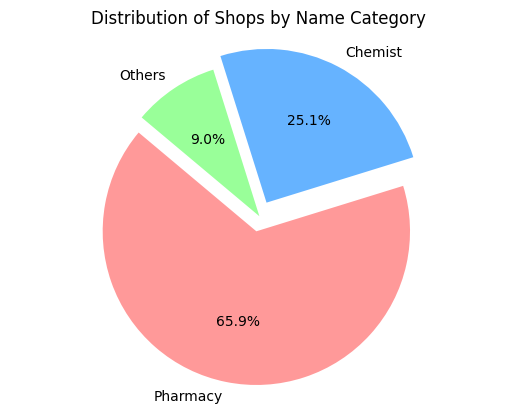

In [29]:
import matplotlib.pyplot as plt
# Filter for shops with 'pharmacy' or 'chemist' in the name
shops_with_pharmacy = df[df['pharmacy_name'].str.contains('pharmacy', case=False)]
shops_with_chemist = df[df['pharmacy_name'].str.contains('chemist', case=False)]

# Create counts for each category
count_pharmacy = shops_with_pharmacy.shape[0]
count_chemist = shops_with_chemist.shape[0]
count_others = df.shape[0] - (count_pharmacy + count_chemist)

# Create data for pie chart
labels = ['Pharmacy', 'Chemist', 'Others']
sizes = [count_pharmacy, count_chemist, count_others]
colors = ['#FF9999', '#66B3FF', '#99FF99']
explode = (0.1, 0.1, 0)  # Only explode the first two sections

# Plot the pie chart
plt.pie(sizes, labels=labels, colors=colors, explode=explode, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of Shops by Name Category')
plt.show()

In [66]:
# Filter for shops with 'pharmacy' or 'chemist' in the name
shops_with_pharmacy = df[df['pharmacy_name'].str.contains('pharmacy', case=False)]
shops_with_chemist = df[df['pharmacy_name'].str.contains('chemist', case=False)]

# Create counts for each category
count_pharmacy = shops_with_pharmacy.shape[0]
count_chemist = shops_with_chemist.shape[0]
count_others = df.shape[0] - (count_pharmacy + count_chemist)

# Data for the pie chart
labels = ['Pharmacy', 'Chemist', 'Others']
sizes = [count_pharmacy, count_chemist, count_others]

# Create the pie chart with Plotly Express
fig = px.pie(
    names=labels,
    values=sizes,
    title='Distribution of Shops by Name Category',
    color_discrete_sequence=['#FF9999', '#66B3FF', '#99FF99']
)

# Add text info to the pie chart
fig.update_traces(textinfo='percent+label')

# Show the pie chart
fig.show()

In [28]:
# Find shops specifically named 'Chemist Warehouse'
chemist_warehouse_shops = df[df['pharmacy_name'].str.contains('Chemist Warehouse', case=False)]

# Count these shops
total_chemist_warehouse = chemist_warehouse_shops.shape[0]
print(f"Total number of 'Chemist Warehouse' shops: {total_chemist_warehouse}")


Total number of 'Chemist Warehouse' shops: 91


In [49]:
import plotly_express as px
# Filter for all shops with 'chemist' in their name
shops_with_chemist = df[df['pharmacy_name'].str.contains('chemist', case=False)]

# Filter for 'Chemist Warehouse' shops
shops_chemist_warehouse = df[df['pharmacy_name'].str.contains('Chemist Warehouse', case=False)]

# Calculate counts
total_chemists = shops_with_chemist.shape[0]
total_pharmacies = df['pharmacy_name'].shape[0]
total_chemist_warehouse = shops_chemist_warehouse.shape[0]

# Create data for the pie chart
labels = ['Chemist Warehouse', 'Other Chemists']
sizes = [total_chemist_warehouse, total_chemists - total_chemist_warehouse]
colors = ['#66B3FF', '#FF9999']

# Create the pie chart with Plotly Express
fig = px.pie(
    names=labels,
    values=sizes,
    title='Proportion of Chemist Warehouse Among Chemists (shop name)',
    color_discrete_sequence=colors,
    hole=0.4  # This creates a donut-style chart
)
# Add a custom annotation for total chemists and Chemist Warehouse
annotation_text_1 = f"Total Chemist Shops: {total_chemists}, Total Chemist Warehouse: {total_chemist_warehouse}"
fig.add_annotation(
    text=annotation_text_1,
    x=0.5,  # X position (centered)
    y=-0.1,  # Y position (below the chart)
    showarrow=False,
    font=dict(size=12, color='black'),
    xref='paper',
    yref='paper'
)

# Add a custom annotation for total pharmacies
annotation_text_2 = f"Total Pharmacy Shops: {total_pharmacies}"
fig.add_annotation(
    text=annotation_text_2,
    x=0.5,  # X position (centered)
    y=-0.2,  # Y position (further below to avoid overlap)
    showarrow=False,
    font=dict(size=12, color='black'),
    xref='paper',
    yref='paper'
)

# Show the pie chart with annotation
fig.show()